/Users/carolinegilbert/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


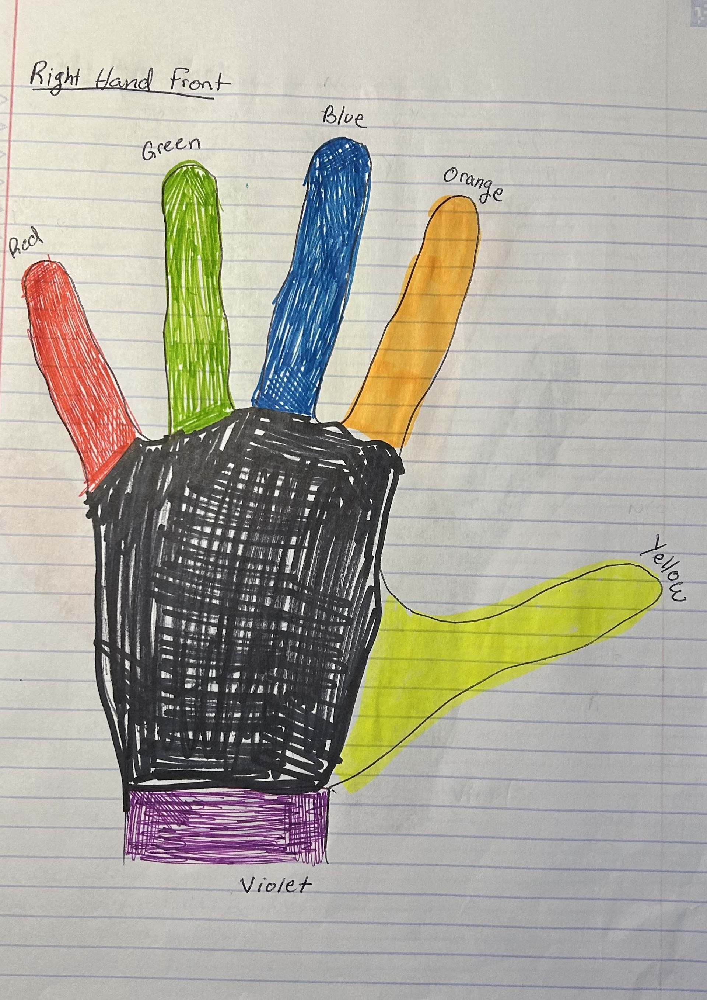

image size =  (2711, 1919)


Dispalying colour image of the scene


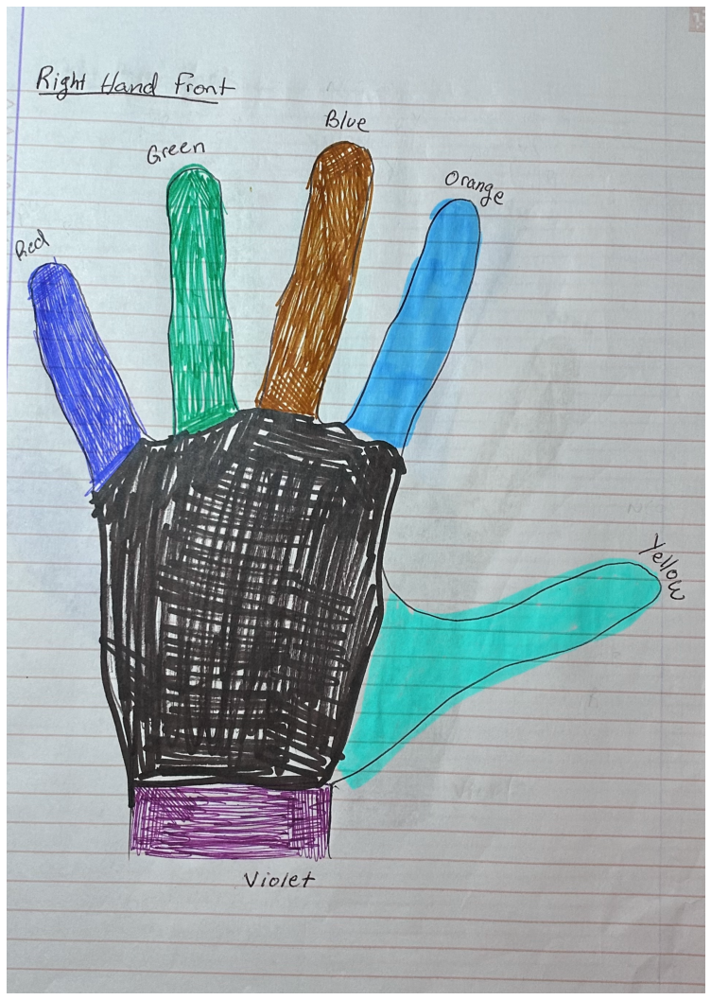

In [1]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cv2
import numpy as np

# Regular RGB image
display(Image(filename='color-glove1.jpg'))

# Read RGB image into an array
img = cv2.imread('color-glove1.jpg')
img_shape = img.shape[:2]
print('image size = ',img_shape)

# RGB n_bands is 3
n_bands = 3
# 3 dimensional dummy array with zeros
MB_img = np.zeros((img_shape[0],img_shape[1],n_bands))
# stacking up images into the array
for i in range(n_bands):
    MB_img[:,:,i] = cv2.imread('color-glove'+str(i+1)+'.jpg',
                               cv2.IMREAD_GRAYSCALE)  
# Pseudocolor image
print('\n\nDispalying colour image of the scene')
plt.figure(figsize=(img_shape[0]/100,img_shape[1]/100))
plt.imshow(img, vmin=0, vmax=255)
plt.axis('off');

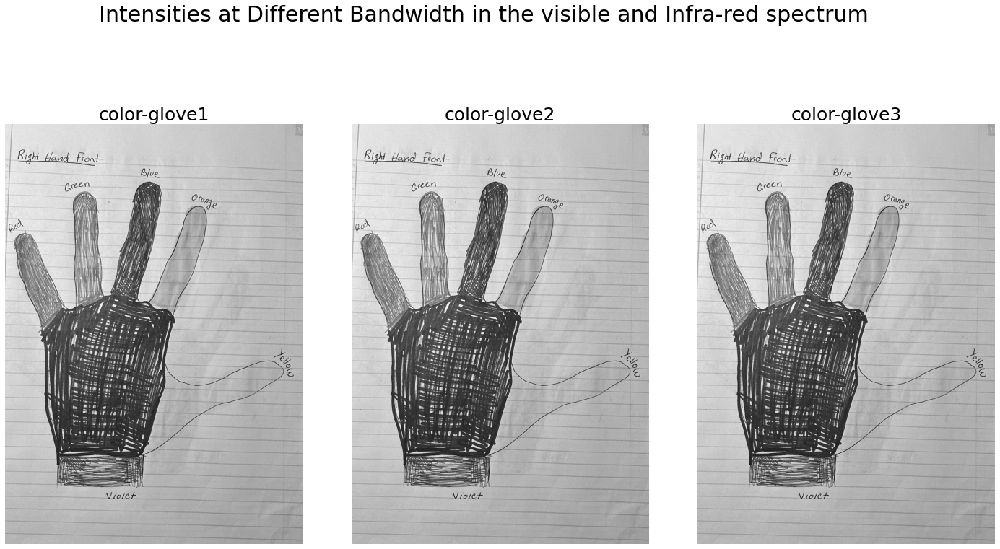

In [22]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig,axes = plt.subplots(2,3,figsize=(25,23),sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities at Different Bandwidth in the visible and Infra-red spectrum', fontsize=30)
axes = axes.ravel()

for i in range(n_bands):
    axes[i].imshow(MB_img[:,:,i],cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('color-glove'+str(i+1),fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])
fig.delaxes(axes[-2])
fig.delaxes(axes[-3])


In [23]:
# Convert 2d band array in 1-d to make them as feature vectors and Standardization
MB_matrix = np.zeros((MB_img[:,:,0].size,n_bands))
for i in range(n_bands):
    MB_array = MB_img[:,:,i].flatten()  # covert 2d to 1d array 
    MB_arrayStd = (MB_array - MB_array.mean())/MB_array.std()  
    MB_matrix[:,i] = MB_arrayStd
MB_matrix.shape;

In [24]:
# Covariance
np.set_printoptions(precision=3)
cov = np.cov(MB_matrix.transpose())

# Eigen Values
EigVal,EigVec = np.linalg.eig(cov)
print("Eigenvalues:\n\n", EigVal,"\n")

Eigenvalues:

 [4.441e-16 3.000e+00 4.930e-32] 



In [25]:
# Ordering Eigen values and vectors
order = EigVal.argsort()[::-1]
EigVal = EigVal[order]
EigVec = EigVec[:,order]

#Projecting data on Eigen vector directions resulting to Principal Components 
PC = np.matmul(MB_matrix,EigVec)   #cross product

Text(0.5, 0.98, 'Pair plot of PCs')

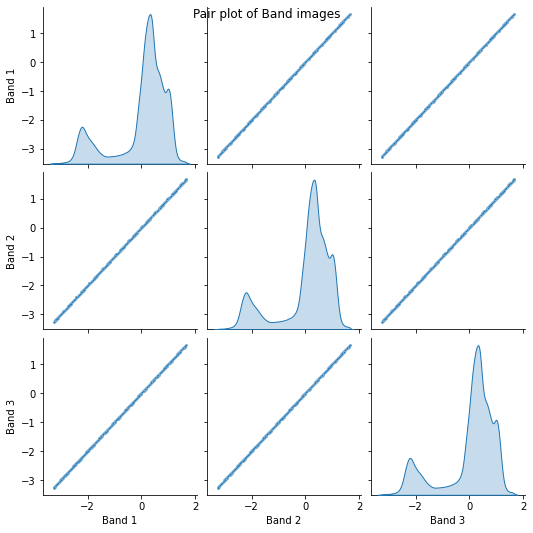

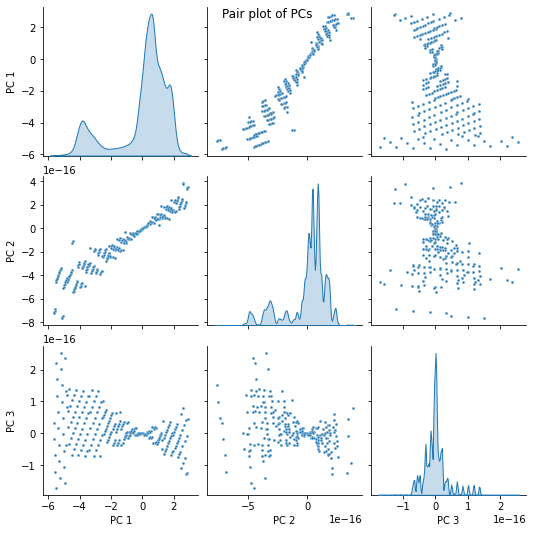

In [26]:
# Generate Paiplot for original data and transformed PCs

Bandnames = ['Band 1','Band 2','Band 3']
a = sns.pairplot(pd.DataFrame(MB_matrix,
                columns = Bandnames),
                 diag_kind='kde',plot_kws={"s": 3})

a.fig.suptitle("Pair plot of Band images")

PCnames = ['PC 1','PC 2','PC 3']
b = sns.pairplot(pd.DataFrame(PC,
                columns = PCnames),
                 diag_kind='kde',plot_kws={"s": 3})

b.fig.suptitle("Pair plot of PCs")

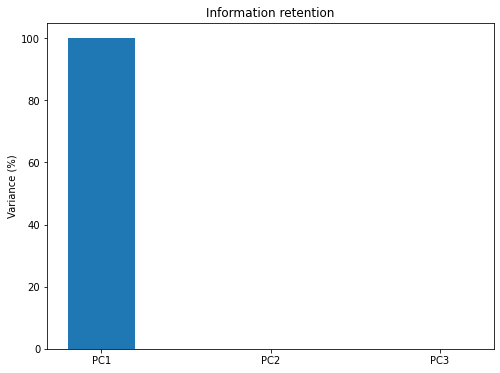

In [27]:
#Information Retained by Principal Components

plt.figure(figsize=(8,6))
plt.bar([1,2,3],EigVal/sum(EigVal)*100,align='center',width=0.4,
        tick_label = ['PC1','PC2','PC3'])
plt.ylabel('Variance (%)')
plt.title('Information retention');

In [28]:
# Rearranging 1-d arrays to 2-d arrays of image size
PC_2d = np.zeros((img_shape[0],img_shape[1],n_bands))

for i in range(n_bands):
    PC_2d[:,:,i] = PC[:,i].reshape(-1,img_shape[1])

# normalizing between 0 to 255
PC_2d_Norm = np.zeros((img_shape[0],img_shape[1],n_bands))

for i in range(n_bands):
    PC_2d_Norm[:,:,i] = cv2.normalize(PC_2d[:,:,i],
                    np.zeros(img_shape),0,255 ,cv2.NORM_MINMAX)

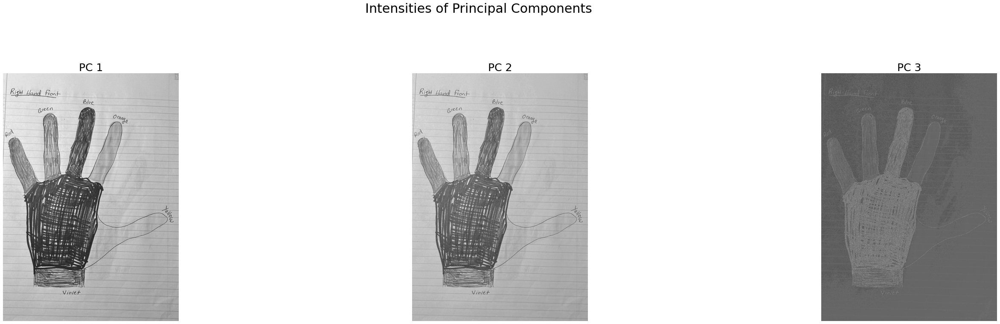

In [30]:
fig,axes = plt.subplots(2,3,figsize=(50,23),sharex='all',
                        sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities of Principal Components ', fontsize=30)
axes = axes.ravel()

for i in range(n_bands):
    axes[i].imshow(PC_2d_Norm[:,:,i],cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])
fig.delaxes(axes[-2])
fig.delaxes(axes[-3])

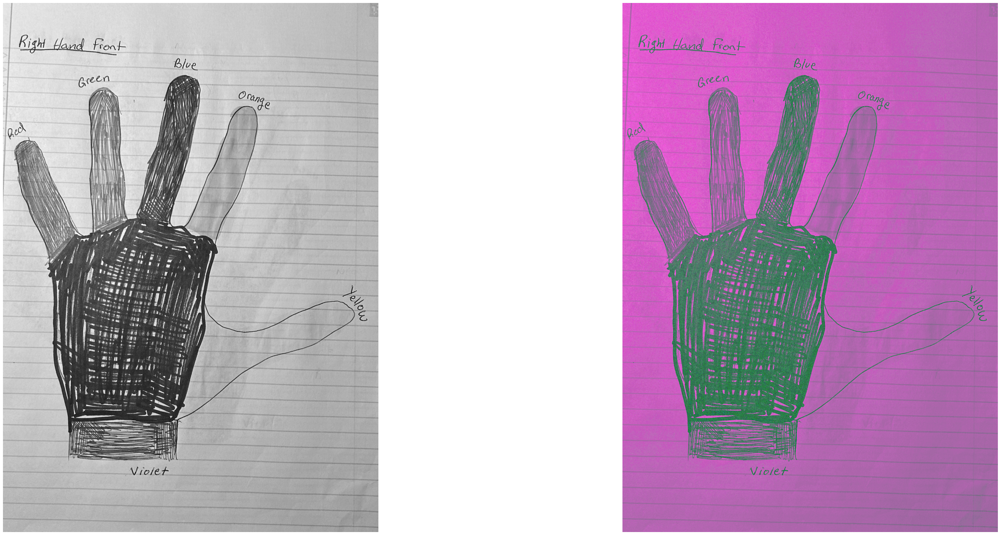

In [31]:
# Comparsion of RGB and Image produced using first three bands
fig,axes = plt.subplots(1,2,figsize=(50,23),
                        sharex='all', sharey='all')   
fig.subplots_adjust(wspace=0.1, hspace=0.15)

axes[0].imshow(MB_img[:,:,0:3].astype(int))
axes[0].axis('off');
axes[1].imshow(PC_2d_Norm[:,:,:3][:,:,[0,2,1]].astype(int))
axes[1].axis('off');